<div style="text-align:center">
  <img width="400px" height="300px" src="https://tu-freiberg.de/sites/default/files/styles/medium/public/2024-06/Logo1.png?itok=A-aykkFN" alt="TUBAF Logo">
  <div class="main"> <br/>
    <h1><b>Financial Forecasting Equations with Scientific Machine Learning</b></h1>
    <div><h5>By</h5></div><br/>
    <div><h4>Parsa Besharat</h4></div>
    <div><h5>A documentation submitted as a part of requirements for the Lecture Current Topics in Numerical Analysis - Scientific Machine Learning ,
        of MS's Mathematics of Data and Resources Sciences. at Technische Universität Bergakademie Freiberg.
    </h5></div>
</div>
</div>
</div>


<div style="text-align:center" class="main">
    <h4>July, 2025</h4>
    <h3>Supervisor: Jan Blechschmidt</h3>
</div>

<div style="text-align: center;">
  <h1>Abstract</h1>
  Financial markets are inherently nonlinear, dynamic, and noisy, posing significant challenges for traditional time series forecasting methods. This document explores a novel approach to financial forecasting by integrating Scientific Machine Learning (SciML) techniques, specifically the Sparse Identification of Nonlinear Dynamics (SINDy) <a href="#ref1">[1]</a> algorithm, with domain knowledge from financial time series analysis <a href="#ref3">[3]</a> and advanced feature engineering. We aim to discover interpretable differential equations that govern market behavior. Financial concepts such as returns and volatility are incorporated as features <a href="#ref3">[3]</a>, guided by methodologies from López de Prado’s <i>Advances in Financial Machine Learning</i> <a href="#ref4">[4]</a>. The resulting hybrid framework enables both data-driven discovery of governing equations and quantitative forecasting, with an emphasis on sparse, explainable models. Our experiments on cryptocurrency and equity datasets demonstrate the potential of SINDy-based models <a href="#ref2">[2]</a> to extract meaningful dynamics and offer competitive forecasting performance, especially when enhanced with carefully engineered financial features. This work contributes to the growing field of explainable SciML applications in finance, bridging theoretical dynamics and real-world market signals.
</div>


# Contents

<ul>
  <li><a href="#1-goal">Goal</a></li>
  <li><a href="#2-iden">System identification</a></li>
  <li>
    <a href="#sindy">SINDy Algorithm</a>
    <ul>
      <li><a href="#mb">Mathematical background </a></li>
      <li><a href="#wp">SINDy's Working Process</a></li>
      <li><a href="#">Lotka Volterra </a></li>
    </ul>
  </li>
  <!-- remove or fill these if you need more top-level items -->
  <li><a href="#4">Financial Time Series and Their Characteristics</a></li>
  <li><a href="#5">Fifth item</a></li>
  <li><a href="#6">Sixth item</a></li>
</ul>


<h1 id="1-goal">Goal</h1>



  <div class="goal-box">
    <p>
      The goal of this project is to discover the hidden equations behind financial markets using 
      <strong>SINDy</strong> then we use <strong>machine learning</strong>, and use those equations to 
      predict prices and ideally <strong>maximize profit</strong> with <strong>no losses</strong>.
    </p>
  </div>




# System identification
<a href="#2-iden"></a>

System identification refers to the process of leveraging measurement data to infer governing equations <a href="#ref1">[1]</a>, in the form of dynamical systems, describing the data. Once discovered, these equations can make predictions about future states, can inform control inputs, or can enable the theoretical study using analytical techniques. 

# SINDy Algorithm
<span id="sindy"></span>

SINDy stands for Sparse Identification of Nonlinear Dynamical Systems.
It’s a machine learning method that discovers the underlying equations (like physics or biology equations) that govern how something changes over time just from observed data. <a href="#ref1">[1]</a>

By feeding this data into SINDy, which it tries different combinations of math functions, we will find the best close up ahead equation which is either exact equation or very close to real equation. <a href="#ref1">[1]</a>

### Mathematical background <a href="#ref1">[1]</a>
<span id="mb"></span> 

Considering we do have a general dynamic system:


$$
\dot{\mathbf{x}}(t) = f(\mathbf{x}(t))
$$

**Where:**  
$\mathbf{x}(t) = \begin{bmatrix} x_1(t) & x_2(t) & \cdots & x_n(t) \end{bmatrix}^\top \in \mathbb{R}^n$ is the system state vector at time $t$. For example, the populations of rabbits and foxes.

$f(\mathbf{x})$ is the unknown (nonlinear) function that governs the dynamics.  
$\dot{\mathbf{x}}(t)$ is the time derivative of the state — i.e., how the system evolves.



## SINDy's working process <span id="wp"></span> 


### Data Collection

To collect data for learning $f$, we record the system's state and its time derivatives at $m$ different time points:

$$
\mathbf{X} = 
\begin{bmatrix}
\mathbf{x}^\top(t_1) \\
\mathbf{x}^\top(t_2) \\
\vdots \\
\mathbf{x}^\top(t_m)
\end{bmatrix}
=
\begin{bmatrix}
x_1(t_1) & x_2(t_1) & \cdots & x_n(t_1) \\
x_1(t_2) & x_2(t_2) & \cdots & x_n(t_2) \\
\vdots & \vdots & \ddots & \vdots \\
x_1(t_m) & x_2(t_m) & \cdots & x_n(t_m)
\end{bmatrix}
$$

$$
\dot{\mathbf{X}} = 
\begin{bmatrix}
\dot{\mathbf{x}}^\top(t_1) \\
\dot{\mathbf{x}}^\top(t_2) \\
\vdots \\
\dot{\mathbf{x}}^\top(t_m)
\end{bmatrix}
=
\begin{bmatrix}
\dot{x}_1(t_1) & \dot{x}_2(t_1) & \cdots & \dot{x}_n(t_1) \\
\dot{x}_1(t_2) & \dot{x}_2(t_2) & \cdots & \dot{x}_n(t_2) \\
\vdots & \vdots & \ddots & \vdots \\
\dot{x}_1(t_m) & \dot{x}_2(t_m) & \cdots & \dot{x}_n(t_m)
\end{bmatrix}
$$

**Where:**  
- $\mathbf{X}$ is the matrix of state snapshots (rows = time samples, columns = variables).  
- $\dot{\mathbf{X}}$ is the matrix of estimated derivatives.



it says that the system changes over time according to some (possibly nonlinear) function of its current state. <a href="#ref1">[1]</a>



### Build a "Library" of Possible Terms


To discover the governing dynamics, we build a large library of candidate functions from $\mathbf{X}$:

$$
\Theta(\mathbf{X}) =
\begin{bmatrix}
1 & \mathbf{X} & \mathbf{X}^{P2} & \mathbf{X}^{P3} & \cdots & \sin(\mathbf{X}) & \cos(\mathbf{X}) & \sin(2\mathbf{X}) & \cos(2\mathbf{X}) & \cdots
\end{bmatrix}
$$

**Where:**  
- $\Theta(\mathbf{X})$ is the **function library**, composed of many possible nonlinear functions of the system state variables.  
- Each **column** of $\Theta(\mathbf{X})$ is a different function (e.g. $x_1^2$, $x_1x_2$, $\sin(x_2)$, etc.) applied to each row of $\mathbf{X}$.  
- The system's true dynamics are assumed to be **sparse** in this space — i.e., only a few of these functions are needed to express $\dot{\mathbf{X}}$.



For example, the quadratic nonlinearities (degree 2) in the state variables form the matrix $\mathbf{X}^{P2}$:

$$
\mathbf{X}^{P2} = 
\begin{bmatrix}
x_1^2(t_1) & x_1(t_1)x_2(t_1) & \cdots & x_n^2(t_1) \\
x_1^2(t_2) & x_1(t_2)x_2(t_2) & \cdots & x_n^2(t_2) \\
\vdots & \vdots & \ddots & \vdots \\
x_1^2(t_m) & x_1(t_m)x_2(t_m) & \cdots & x_n^2(t_m)
\end{bmatrix}
$$

**Where:**  
- Each row corresponds to a single time sample $t_i$.  
- Each column is one quadratic combination of the original state variables (e.g., $x_1^2$, $x_1 x_2$, $x_2^2$, etc.).  
- Similar expansions can be made for higher-order polynomials like $\mathbf{X}^{P3}$ (cubic terms) or trigonometric terms like $\sin(\mathbf{X})$.




### Sparse regression

In real-world settings, measurements are often noisy, so the sparse regression problem becomes:

$$
\dot{\mathbf{X}} = \Theta(\mathbf{X}) \, \boldsymbol{\Xi} + \eta \mathbf{Z}
$$

**Where:**  
- $\dot{\mathbf{X}} \in \mathbb{R}^{m \times n}$ is the matrix of estimated time derivatives of the state variables.  
- $\Theta(\mathbf{X}) \in \mathbb{R}^{m \times p}$ is the **function library**, where each column is a candidate nonlinear function of the state variables.  
- $\boldsymbol{\Xi} \in \mathbb{R}^{p \times n}$ is the **sparse coefficient matrix** that we want to learn. Each column $\xi_k$ contains the active terms that explain how $x_k$ changes.  
- $\mathbf{Z} \in \mathbb{R}^{m \times n}$ is a matrix of independent, zero-mean Gaussian noise.  
- $\eta$ is a scalar controlling the **noise magnitude**.



The goal is to find a **sparse** $\boldsymbol{\Xi}$ such that the predicted derivatives $\Theta(\mathbf{X}) \boldsymbol{\Xi}$ match the true $\dot{\mathbf{X}}$ as closely as possible, despite the presence of noise.

This can be solved using algorithms such as:
- **LASSO** (least absolute shrinkage and selection operator), or  
- **Sequential Thresholded Least Squares (STLSQ)**, which is faster and more commonly used in SINDy.



We don’t know what the true equations are.
But we assume they can be built from a few simple functions of the variables.<a href="#ref1">[1]</a>

## Example - Lotka Volterra 

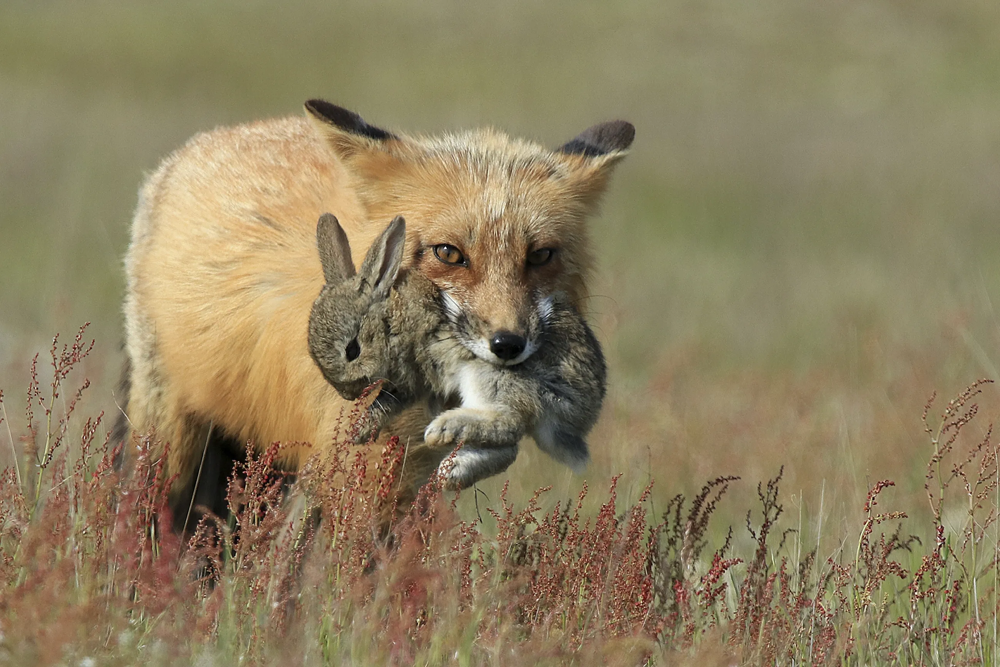

<div style="text-align: center;">
  <em>Figure 1: A fox got a rabbit.</em>
</div>


To model the evolution of the prey and predators like Rabbits and Foxes, we can use such lotka volterra equations:



$$
\begin{aligned}
\frac{dx}{dt} &= \alpha\,x \;-\; \beta\,x\,y,\\
\frac{dy}{dt} &= -\gamma\,y \;+\; \delta\,x\,y.
\end{aligned}
$$

**Where:**  
$x(t)$ is the prey population (e.g., rabbits).  
$y(t)$ is the predator population (e.g., foxes).

**Parameters:**  
- $\alpha$: Prey growth rate in the absence of predators.  
- $\beta$: Prey death rate due to predation (more foxes $\Rightarrow$ more rabbits eaten).  
- $\gamma$: Predator death rate in the absence of prey.  
- $\delta$: Predator growth rate per prey consumed.  


Besides the issue of solving the model, we already notice that for forecasting, we need to know the four coefficients rates, and initial states <a href="#ref5">[5]</a>.

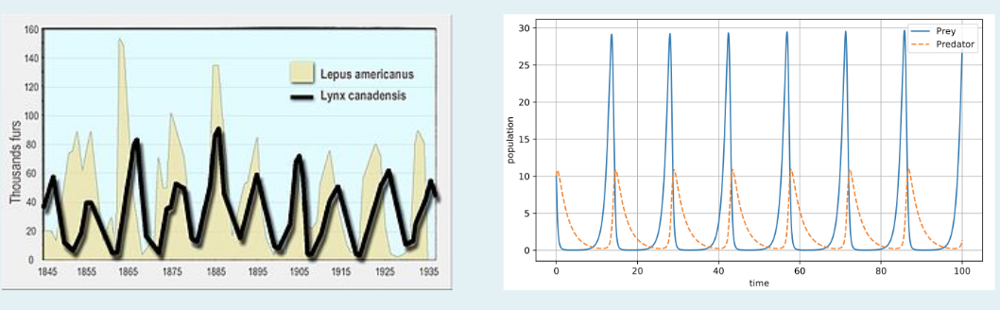

<div style="text-align: center;">
  <em>Figure 2: Left plot = real fur trading data (hares and lynx): noisy, irregular cycles. while the right plot = ideal Lotka–Volterra simulation: smooth, periodic oscillations. <a href="#ref5">[5]</a></em>
</div>


### Goal of SINDy

We have the data of rabbit and foxes and their population over time. However we do not have exact equations for them. SINDy help us to get those equations.

### Time for a code

### Installing dependencies

#### Since there is a known bug in PySINDy’s finite-difference code when used with NumPy 2.x, we need to  downgrade my numpy to version 1.26.4

In [3]:
pip install numpy==1.26.4

Note: you may need to restart the kernel to use updated packages.


### Goal: Find exact or approximation of the Lotka Volterra equation.

We solve the sparse regression via sequential thresholded least squares (STLSQ), zeroing out any tiny coefficients.<a href="#ref2">[2]</a>

(x)' = 1.001 x + -0.100 x*y
(y)' = -1.498 y + 0.075 x*y


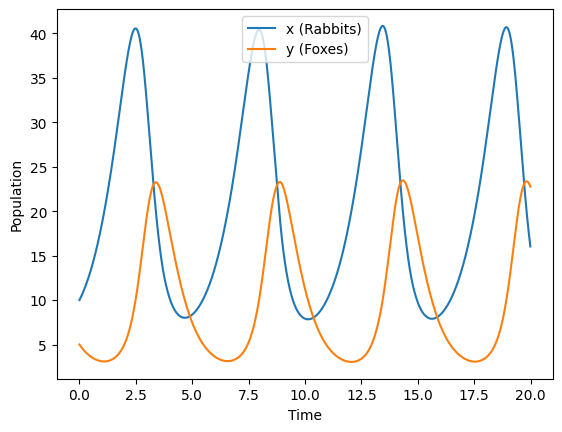

In [4]:
import pandas as pd
import numpy as np
import pysindy as ps
import matplotlib.pyplot as plt

df = pd.read_csv('data.csv')
data = df[['x','y']].values
dt = 0.01

lv_lib = ps.CustomLibrary(
    library_functions=[
        lambda x, y: x,
        lambda x, y: y,
        lambda x, y: x * y
    ],
    function_names=[
        lambda xn, yn: xn,
        lambda xn, yn: yn,
        lambda xn, yn: f"{xn}*{yn}"
    ]
)

model = ps.SINDy(
    feature_library=lv_lib,
    optimizer=ps.STLSQ(threshold=0.05),
    feature_names=['x','y']
)
model.fit(data, t=dt)
model.print(precision=3)

t = np.arange(data.shape[0]) * dt
plt.plot(t, data[:, 0], label='x (Rabbits)')
plt.plot(t, data[:, 1], label='y (Foxes)')
plt.xlabel('Time')
plt.ylabel('Population')
plt.legend()
plt.show()


---

# Financial Time Series and Their Characteristics <span id="5"></span>

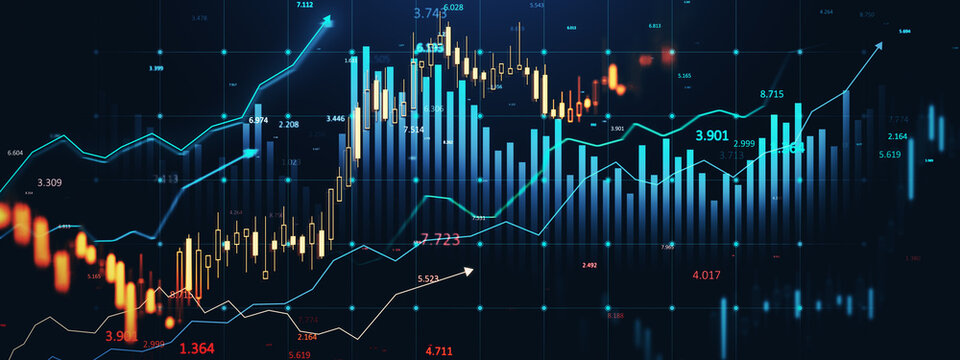


  <p>
    Financial time series are sequences of financial data points recorded over time, such as stock prices or exchange rates. 
    Key characteristics include high frequency of values, volatility that changes over time, and the presence of both 
    systematic and nonsystematic factors. These series are analyzed using various techniques, including those used in 
    traditional time series analysis, but with additional considerations for the changing business and economic environment 
    and the fact that volatility isn't directly observed. <a href="#ref3">[3]</a>
  </p>

  <h4>Elaboration - How and Why is it different from regular data?</h4>

  <ul>
    <li><strong>High Frequency:</strong> Financial data is often collected at very short intervals, like daily or even intraday, leading to a large number of data points in a relatively short period.<a href="#ref2">[2]</a></li>
<br/>
  <li><strong>Volatility:</strong>  It refers to the degree of 
  variation in prices or returns. Volatility is not constant and can change over time, often clustering in periods of 
  high and low volatility.<a href="#ref2">[2]</a></li>
<br/>
  <li><strong>Systematic and Nonsystematic Factors:</strong> The movements in financial time series are influenced by both 
      systematic factors (like macroeconomic trends) and nonsystematic factors (like company-specific news).<a href="#ref2">[2]</a></li>
<br/>
  <li><strong>Added Uncertainty:</strong> Compared to traditional time series analysis, financial time series analysis deals 
      with added uncertainty due to the constantly evolving business and economic environment and the difficulty of directly 
      observing volatility.<a href="#ref2">[2]</a></li>
  </ul>

  <h4>Applications</h4>

  <ul>
    <li>Asset valuation</li>
    <li>Risk management</li>
    <li>Option pricing</li>
  </ul>



 


  <h4>Examples</h4>

  <li>Daily returns on a stock</li>
  <p>Daily stock returns represent the percentage change in a stock's price over a single day. It's calculated by finding the difference between the closing price and the opening price, then dividing that difference by the opening price and multiplying by 100</p>

$$
\begin{aligned}
\text{Daily Return} &= \left( \frac{P_{\text{close}} - P_{\text{open}}}{P_{\text{open}}} \right) \times 100
\end{aligned}
$$

**Where:**  
$P_{\text{close}}$ is the closing price of the stock.  
$P_{\text{open}}$ is the opening price of the stock.


  <li>Time-series of insurance claims</li>
    <p>A time series of insurance claims refers to a sequence of data points that records the number or value of insurance claims over time. This data can be analyzed to identify patterns, trends, and seasonality in claims data, which is crucial for forecasting future claims and managing insurance company risks</p>
  </ul>

  <li>Crypto Currency Asset prices</li>
    <p>A time series of insurance claims refers to a sequence of data points that records the number or value of insurance claims over time. This data can be analyzed to identify patterns, trends, and seasonality in claims data, which is crucial for forecasting future claims and managing insurance company risks</p>
  </ul>



## Asset Returns <a href="#ref2">[2]</a>

<i>How much money did I make or lose?</i><br>
Instead of looking at the price tag, we look at the change in price in a few days or hours.

### Why not using the price itself?

<ul>
  <li>It’s easier to compare different things (cheap coins vs expensive stocks).</li>
  <li>It makes graphs and models simpler.</li>
  <li>It shows how much you gain or lose, not just how big the price is.</li>
</ul>


## Types of Return

### Simple Gross Return

This tells you how much money you have in total after your investment. It includes both your original money and any profit you made. For example, if you invest $100 and now have $110, your gross return is 110% — your full amount.

$$
\begin{aligned}
1 + R_t &= \frac{P_t}{P_{t-1}} \\

\end{aligned}
$$

**Where:**  
$P_t$ is the price today.  
$P_{t-1}$ is the price yesterday.  
$R_t$ is the simple return.


### Simple Net Return

This tells you how much profit or loss you made, as a percentage.
It focuses only on the change in value.
For example, if you started with $100 and now have $110, your simple return is 10%.
It's just the extra amount you earned or you lost, compared to what you started with.

$$
\begin{aligned}
R_t &= \frac{P_t - P_{t-1}}{P_{t-1}}
\end{aligned}
$$

**Where:**  
$P_t$ is the price today.  
$P_{t-1}$ is the price yesterday.  
$R_t$ is the percentage change in price (simple return).


### Log Return

Consider you would like to calculate many times even before, you must use the Log return in this case.
It assumes that returns are earned smoothly and continuously, like interest that grows every moment.

$$
\begin{aligned}
r_t &= \ln\left(\frac{P_t}{P_{t-1}}\right) = \ln(P_t) - \ln(P_{t-1})
\end{aligned}
$$

**Where:**  
$r_t$ is the log return at time $t$  
$P_t$ is the price today  
$P_{t-1}$ is the price yesterday  
$\ln$ means the natural logarithm


## Trends <a href="#ref2">[2]</a><a href="#ref3">[3]</a>
Trends are when prices move in one direction for a while.


### Types of Trends

#### Uptrend

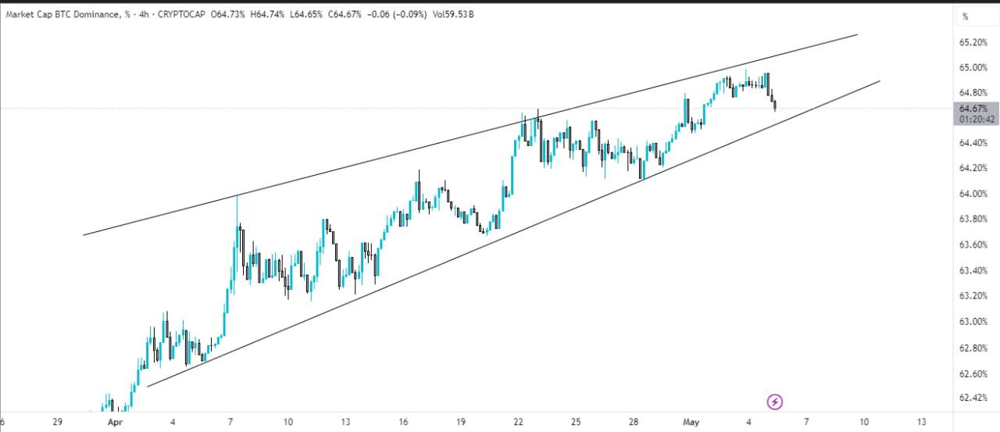

<div style="text-align: center;">
<em>Figure 3, The price has broken out of the falling wedge pattern with strong volume. It is currently facing rejection at the horizontal resistance trendline. A breakout above this resistance could lead to further upward movement. However, a rejection at this level may result in a downward move.</em>
</div>

#### Downtrend

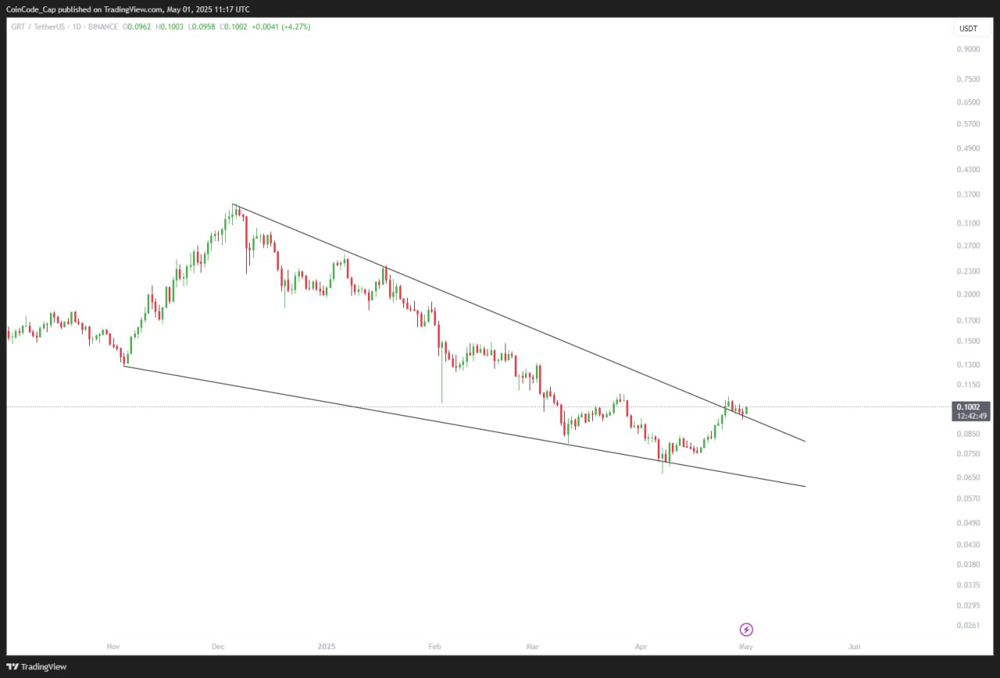

<div style="text-align: center;">
<em>Figure 4, Downtrend of BTC, breaking out the triangle with a retest above it and going down.</em></div>

#### Sideways trend (Normal oscillation)

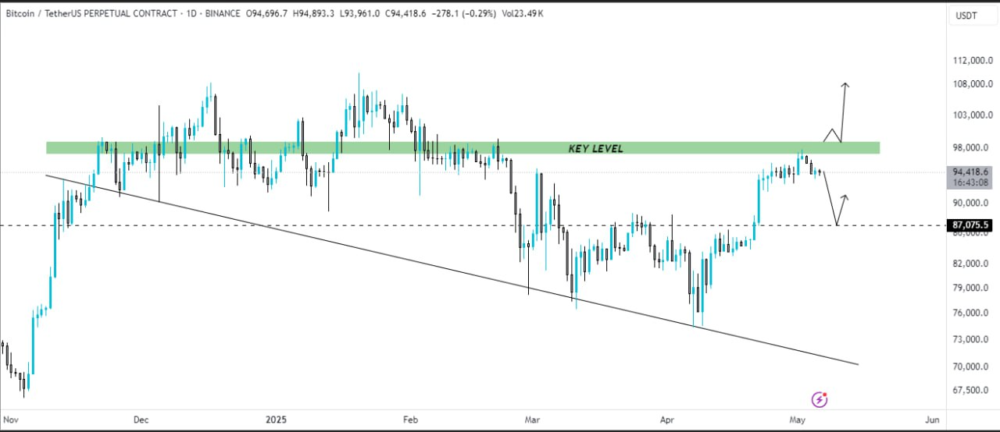

<div style="text-align: center;">
  <em>Figure 5: Sideways trend (Normal oscillation) of Bitcoin. It is facing rejection from the key horizontal resistance level, and a downward movement is expected here as we have marked. A breakout above the resistance zone would indicate the potential for further upward movement. Keep an eye on this level.</em>
</div>

## Why financial markets are so hard to predict:<a href="#ref2">[2]</a>

<ul>
  <li>
    <strong>Too many factors</strong><br>
    Prices can change because of news, tweets, politics, interest rates, emotions — anything.
  </li>
  <br>
  <li>
    <strong>Randomness</strong><br>
    Sometimes prices move for no clear reason. It looks like chaos.
  </li>
  <br>
  <li>
    <strong>Human behavior</strong><br>
    People panic, follow crowds, or get greedy which make price movements messy and emotional.
  </li>
  <br>
  <li>
    <strong>Noisy data</strong><br>
    Financial data jumps around a lot. It’s full of "noise", not just "signals".
  </li>
  <br>
  <li>
    <strong>Short trends</strong><br>
    Even if you find a pattern, it might disappear the next day.
  </li>
  <br>
 
</ul>


# What is Crypto Currency and how does it work?

<img align="center" src="https://images4.alphacoders.com/100/1002783.png">

<div style="text-align:center">
<a href="https://youtu.be/0B3sccDYwuI">Click here to watch the video</a>
</div>

### What is this very hard Math puzzle? <a href="#ref6">[6]</a>
The very hard math puzzle that miners race to solve is really a hash-puzzle based on the SHA-256 cryptographic hash function

### Steps


1. Miners take the current block’s header (which includes things like the previous block hash, Merkle root of transactions, timestamp, etc.) and append a trial nonce <i>n</i>. Then they compute the <strong>double SHA-256 hash</strong> of that data.

$$
\begin{aligned}
h(n) &= \mathrm{SHA256}\left(\mathrm{SHA256}(\text{BlockHeader} \, \| \, n)\right)
\end{aligned}
$$

**Where:**  
$h(n)$ is the hash value for nonce $n$  
$\text{BlockHeader}$ is the current block's metadata  
$n$ is the arbitrary number. 
“$\|$” means **concatenation** (putting data together)


2.

$$
\text{Block validity:} \quad
\begin{cases}
\text{Valid block (solution found)} & \text{if } h(n) \leq \text{Target} \\
\text{Try another } n & \text{if } h(n) > \text{Target}
\end{cases}
$$

**Where:**  
$h(n)$ is the double SHA-256 hash of the block header with nonce $n$  
$\text{Target}$ is the difficulty threshold set by the network  
A block is valid **only if** the hash is less than or equal to the target  
Miners keep trying new $n$ until $h(n) \leq \text{Target}$


### An analysis on Charts and Patterns

Financial Markets use candlesticks in order to depict to behaviors of buyers and sellers.

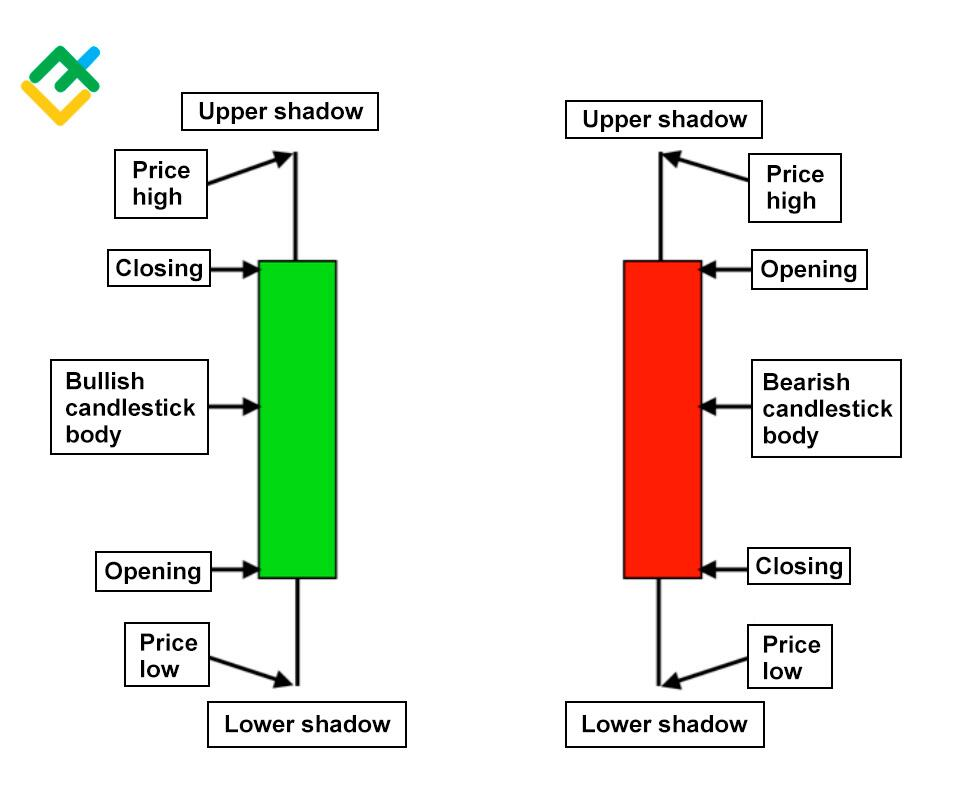

<div style="text-align: center;">
  <em>Figure 6: Depiction of a candlestick and customers behavior; This figure illustrates the fundamental components of bullish (green) and bearish (red) candlesticks used in financial charts. A bullish candlestick represents a price increase over the selected time interval, where the closing price is higher than the opening price. In contrast, a bearish candlestick shows a price decline, with the closing price below the opening price. Both candlestick types display upper and lower shadows (wicks), which indicate the highest and lowest prices reached during the period, respectively. The body of each candlestick visualizes the range between the opening and closing prices, offering insight into market sentiment and momentum.</em>
</div>

### Patterns

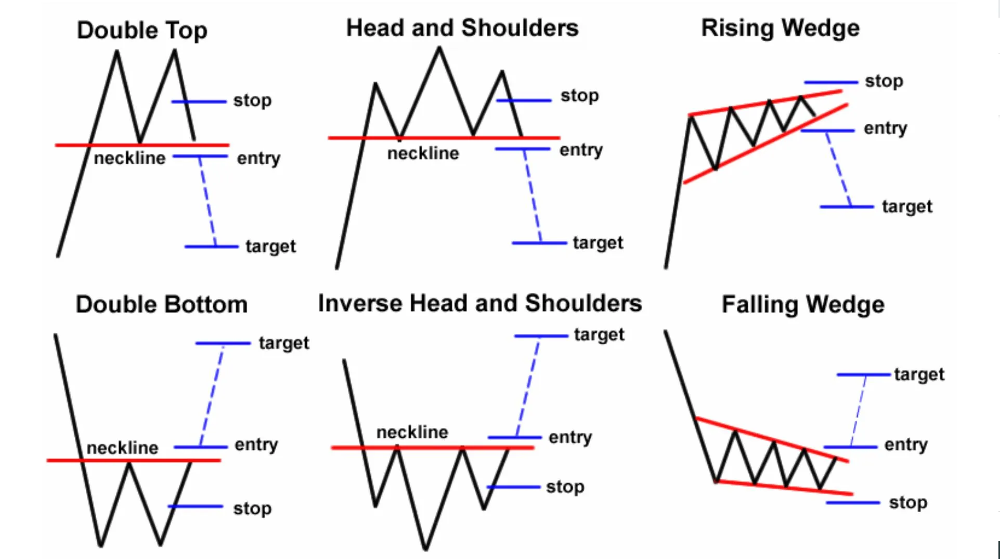

<div style="text-align: center;">
  <em>Figure 7: Common Reversal and Continuation Chart Patterns; This figure presents six widely recognized chart patterns used in technical analysis: Double Top, Head and Shoulders, and Rising Wedge indicate potential bearish reversals, where price is expected to decline after the pattern completes, often triggering entry below the neckline or wedge with defined stop-loss and target levels. Conversely, Double Bottom, Inverse Head and Shoulders, and Falling Wedge suggest bullish reversals, where price is likely to rise following a breakout above the neckline or wedge. Each pattern includes strategic entry, stop, and target points based on the pattern’s height and breakout direction, offering traders structured setups for risk-managed decisions.</em>
</div>

### Will we use these Patterns in order to train our model to predict with highest profit and lowest loss?

---

# Machine learning algorithms used in prediction

<h4>There are multiple prediction algorithms used in order to predict the price over time. For example:</h4>
<ul>
  <li><strong>Machine Learning Algorithms:</strong>
    <ul>
      <li>Linear Regression</li>
      <li>Ridge Regression</li>
      <li>Lasso Regression</li>
      <li>ElasticNet</li>
      <li>Polynomial Regression</li>
      <li>Support Vector Regression (SVR)</li>
      <li>K-Nearest Neighbors Regression (KNN)</li>
      <li>Decision Tree Regression</li>
      <li>Random Forest Regression</li>
      <li><a href="#boost">Extreme Gradient Boosting (XGBoost)</a></li>
    </ul>
  </li>

  <li><strong>Deep Learning Algorithms:</strong>
    <ul>
      <li>Artificial Neural Networks (ANNs)</li>
      <li>Recurrent Neural Networks (RNNs)</li>
      <li><a href="#lstm">Long Short-Term Memory Networks (LSTM)</a></li>
      <li>Gated Recurrent Units (GRU)</li>
      <li>Convolutional Neural Networks (CNNs) for time series</li>
      <li>Transformer Networks (e.g., Time Series Transformer, Informer)</li>
      <li>Temporal Fusion Transformer (TFT)</li>
      <li>Hybrid Models (e.g., ARIMA + LSTM, CNN + LSTM)</li>
    </ul>
  </li>
</ul>


<p>
  We will focus on <a href="#lstm">Long Short-Term Memory Networks (LSTM)</a> and <a href="#boost">Extreme Gradient Boosting (XGBoost)</a> because they represent two of the most powerful and complementary approaches to time-series prediction. Together, these models offer a balanced and robust foundation for building accurate and profit-driven price prediction systems.
</p>


## XGBoost <i id="boost"></i>

## Basic concepts

### Decision tree

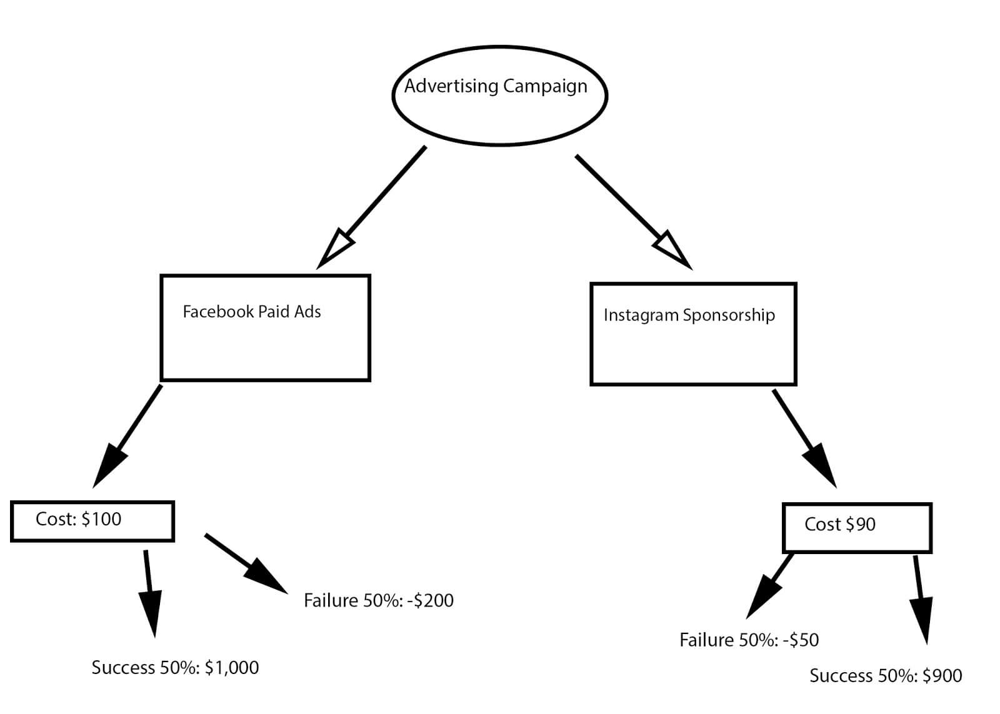

<div style="text-align: center;">
  <em>Figure 8: A decision tree depicting about an Advertising Campaign.</em>
</div>

#### Structure

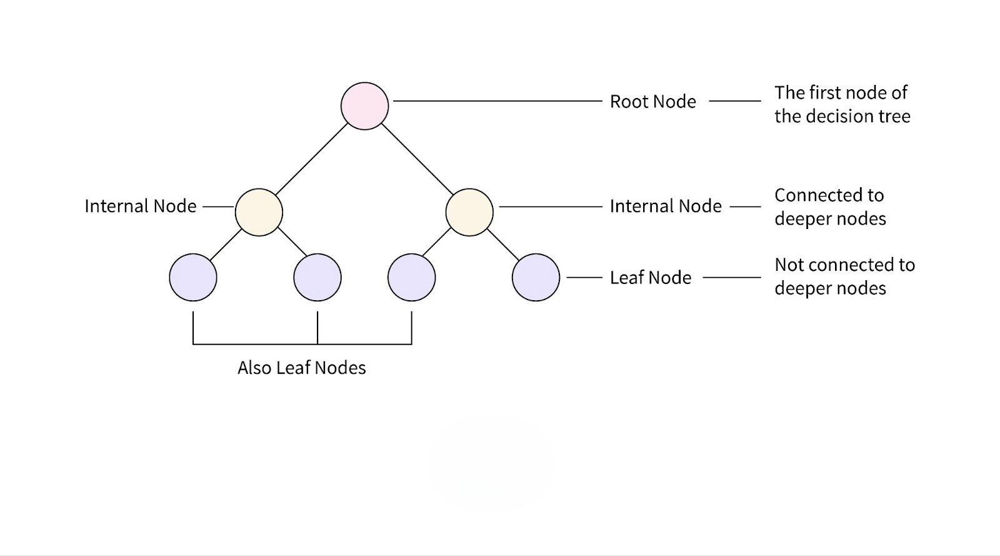

<div style="text-align: center;">
  <em>Figure 9: A decision tree structures.</em>
</div>

Note that for prediction, we have to cut the tree down (Pruning or split the tree into multiple subtrees) in order to have a good prediction because with the more training data we get, the more we lead to overfitting.

However sometimes even by cutting down the tree, we could not have a good prediction that is why we must <b>Boost (or use gradient boosting methods)</b> the tree to have a good and more accurate prediction.

### Gradient Boosting

Gradient boosting is a machine learning technique based on boosting in a functional space. It gives a prediction model in the form of an ensemble of weak prediction models. When a decision tree is the weak learner, the resulting algorithm is called gradient-boosted trees. <a href="#ref8">[8]</a>

In other words, boosting is to improve weak learner sequentially using weighted sample. <a href="#ref8">[8]</a>

#### What is a weak learner?
Weak learner, is learning algorithm which performs just slightly better than random guessing.<a href="#ref8">[8]</a>

#### What is the weighted sample? <a href="#ref8">[8]</a>

Weighted sample: Each training point $(x_i, y_i)$ is assigned a weight $w_i \in (0, 1)$ such that $\sum_{i=1}^m w_i = 1$. Then:

$$
\mathcal{R}_{S, w}(h) = \sum_{i=1}^{m} w_i \, \ell(h(x_i), y_i)
$$

Output: Boosting yields a linear combination of $h_i$ resulting from weak learning of weighted training samples:

$$
h(\mathbf{x}) = \mathrm{sgn} \left( \sum_{t=1}^{T} \alpha_t \, h_t(\mathbf{x}) \right), \quad \alpha_t > 0
$$

<b>Where:</b>

$\mathcal{R}_{S, w}(h)$ is the weighted empirical risk of hypothesis $h$ on sample $S$  
$w_i$ is the weight assigned to training point $(x_i, y_i)$, with $\sum_{i=1}^m w_i = 1$  
$\ell(h(x_i), y_i)$ is the loss between predicted and true label  
$h_t(\mathbf{x})$ is the $t$-th weak learner (classifier)  
$\alpha_t$ is the weight assigned to the $t$-th weak learner  
$\mathrm{sgn}(\cdot)$ is the sign function returning $+1$ or $-1$  
$T$ is the total number of boosting rounds  
$h(\mathbf{x})$ is the final strong classifier composed of all weighted weak learners





## What is XGBoost

XGBoost is an optimized distributed (also a parallel boosting tree) gradient boosting library designed to be highly efficient, flexible and portable. It implements machine learning algorithms under the Gradient Boosting framework.

XGBoost is a tree-based ensemble regression algorithm that models the future BTC price by learning from both current and lagged market features. It sequentially builds decision trees to minimize prediction errors through gradient boosting.

### XGBoost steps in simple words

1. Start with weak predictions (initial guess)

2. Build a tree to correct the errors

3. Build another tree to fix what the last one missed

4. Keep Boosting, then combine all tree outputs

### XGBoost Algorithm Structure 
<ul>
  <li><strong>Input Data:</strong> You prepare a table with features (current and lagged BTC data) and the target (future price).</li>

  <li><strong>Initialization:</strong> Start with a base prediction, usually the mean of the target:</li>
</ul>

$$ \hat{y}_i^{(0)} = \frac{1}{m} \sum_{i=1}^{m} y_i $$

<ul>
  <li><strong>Iterative Boosting:</strong> For each boosting round <i>t = 1</i> to <i>T</i> :</li>
</ul>

$$ r_i^{(t)} = y_i - \hat{y}_i^{(t-1)} $$

$$ \hat{y}_i^{(t)} = \hat{y}_i^{(t-1)} + \eta f_t(x_i) $$

<ul>
  <li><strong>Final Prediction:</strong> After <i>T</i> rounds, the final prediction is:</li>
</ul>

$$ \hat{y}_i = \sum_{t=1}^{T} \eta f_t(x_i) $$

Where:



$
\hat{y}_i^{(0)} \text{ is the initial prediction (mean of targets)} \\
y_i \text{ is the true value for sample } i \\
r_i^{(t)} \text{ is the residual at step } t \\
f_t(x_i) \text{ is the regression tree at round } t \text{ for input } x_i \\
\eta \text{ is the learning rate} \\
T \text{ is the number of boosting rounds} \\
\hat{y}_i \text{ is the final predicted price for sample } i
$


### Prediction Steps using XGBoost

<table border="1" cellpadding="8" cellspacing="0">
  <thead>
    <tr>
      <th>Concept</th>
      <th>You Should Know</th>
    </tr>
  </thead>
  <tbody>
    <tr>
      <td>SINDy Algorithm</td>
      <td>What are the equations of the Dataset?</td>
    </tr>
    <tr>
      <td>Gradient boosting</td>
      <td>How it improves over residuals</td>
    </tr>
    <tr>
      <td>Decision trees</td>
      <td>How they split data to predict values</td>
    </tr>
    <tr>
      <td>Feature engineering</td>
      <td>How to extract past state (lag features)</td>
    </tr>
    <tr>
      <td>Hyperparameters</td>
      <td>Tree depth, learning rate, number of rounds</td>
    </tr>
    <tr>
      <td>Loss function</td>
      <td>Usually Mean Squared Error (MSE) for price prediction</td>
    </tr>
    <tr>
      <td>Overfitting control</td>
      <td>Using <code>max_depth</code>, <code>subsample</code>, <code>colsample_bytree</code></td>
    </tr>
  </tbody>
</table>


## Time for a code

### Installing Dependencies

In [5]:
pip install xgboost

Note: you may need to restart the kernel to use updated packages.


### Data Set Structure and cleaning

In [6]:
import pandas as pd

data = pd.read_csv("BTC-USD.csv")
df = pd.DataFrame(data)
df.head()

,Date,Open,High,Low,Close,Adj Close,Volume
0,2014-09-17,465.864014,468.174011,452.421997,457.334015,457.334015,21056800.0
1,2014-09-18,456.859985,456.859985,413.104004,424.440002,424.440002,34483200.0
2,2014-09-19,424.102997,427.834991,384.532013,394.795990,394.795990,37919700.0
3,2014-09-20,394.673004,423.295990,389.882996,408.903992,408.903992,36863600.0
4,2014-09-21,408.084991,412.425995,393.181000,398.821014,398.821014,26580100.0


In [7]:
df.describe()

,Open,High,Low,Close,Adj Close,Volume
count,2530.000000,2530.000000,2530.000000,2530.000000,2530.000000,2.530000e+03
mean,8581.208790,8827.542899,8314.356161,8599.314657,8599.314657,1.325395e+10
std,12672.856486,13066.982740,12225.142520,12695.366642,12695.366642,1.979314e+10
min,176.897003,211.731003,171.509995,178.102997,178.102997,5.914570e+06
25%,572.634476,577.809250,566.011734,572.849243,572.849243,7.178582e+07
50%,5077.713868,5282.096680,4987.065674,5093.062745,5093.062745,4.299460e+09
75%,9469.311767,9654.489258,9262.651612,9477.050537,9477.050537,2.066714e+10
max,63523.753906,64863.097656,62208.964844,63503.457031,63503.457031,3.509679e+11


In [8]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2534 entries, 0 to 2533
Data columns (total 7 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   Date       2534 non-null   object 
 1   Open       2530 non-null   float64
 2   High       2530 non-null   float64
 3   Low        2530 non-null   float64
 4   Close      2530 non-null   float64
 5   Adj Close  2530 non-null   float64
 6   Volume     2530 non-null   float64
dtypes: float64(6), object(1)
memory usage: 138.7+ KB


In [9]:
df.head()

,Date,Open,High,Low,Close,Adj Close,Volume
0,2014-09-17,465.864014,468.174011,452.421997,457.334015,457.334015,21056800.0
1,2014-09-18,456.859985,456.859985,413.104004,424.440002,424.440002,34483200.0
2,2014-09-19,424.102997,427.834991,384.532013,394.795990,394.795990,37919700.0
3,2014-09-20,394.673004,423.295990,389.882996,408.903992,408.903992,36863600.0
4,2014-09-21,408.084991,412.425995,393.181000,398.821014,398.821014,26580100.0


In [10]:
df.isnull().values.sum()

24

In [11]:
df.isnull().values.any()

True

In [12]:
df.fillna(0)

,Date,Open,High,Low,Close,Adj Close,Volume
0,2014-09-17,465.864014,468.174011,452.421997,457.334015,457.334015,2.105680e+07
1,2014-09-18,456.859985,456.859985,413.104004,424.440002,424.440002,3.448320e+07
2,2014-09-19,424.102997,427.834991,384.532013,394.795990,394.795990,3.791970e+07
3,2014-09-20,394.673004,423.295990,389.882996,408.903992,408.903992,3.686360e+07
4,2014-09-21,408.084991,412.425995,393.181000,398.821014,398.821014,2.658010e+07
...,...,...,...,...,...,...,...
2529,2021-08-20,46723.121094,49342.152344,46650.707031,49339.175781,49339.175781,3.470687e+10
2530,2021-08-21,49327.074219,49717.019531,48312.199219,48905.492188,48905.492188,4.058521e+10
2531,2021-08-22,48869.105469,49471.609375,48199.941406,49321.652344,49321.652344,2.537098e+10
2532,2021-08-23,49291.675781,50482.078125,49074.605469,49546.148438,49546.148438,3.430505e+10


#### EDA

In [13]:
sd = df.iloc[0][0]
ed = df.iloc[-1][0]

print(sd)
print(ed)

2014-09-17
2021-08-24


/tmp/ipykernel_250688/2411168065.py:1: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  sd = df.iloc[0][0]
/tmp/ipykernel_250688/2411168065.py:2: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  ed = df.iloc[-1][0]


#### Seprating dates

In [14]:
date = df["Date"]
date = pd.to_datetime(date)
df["year"] = date.dt.year
df["month"] = date.dt.month
df["day"] = date.dt.day
df['new_mon'] = date.dt.month_name()


#### Assigning Variables

In [15]:
open = df["Open"]
high = df["High"]
low = df["Low"]
close = df["Close"]
volume = df["Volume"]
year = df["year"]
month = df["month"]
day = df["day"]


In [16]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2534 entries, 0 to 2533
Data columns (total 11 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   Date       2534 non-null   object 
 1   Open       2530 non-null   float64
 2   High       2530 non-null   float64
 3   Low        2530 non-null   float64
 4   Close      2530 non-null   float64
 5   Adj Close  2530 non-null   float64
 6   Volume     2530 non-null   float64
 7   year       2534 non-null   int32  
 8   month      2534 non-null   int32  
 9   day        2534 non-null   int32  
 10  new_mon    2534 non-null   object 
dtypes: float64(6), int32(3), object(2)
memory usage: 188.2+ KB


In [17]:
df.head()

,Date,Open,High,Low,Close,Adj Close,Volume,year,month,day,new_mon
0,2014-09-17,465.864014,468.174011,452.421997,457.334015,457.334015,21056800.0,2014,9,17,September
1,2014-09-18,456.859985,456.859985,413.104004,424.440002,424.440002,34483200.0,2014,9,18,September
2,2014-09-19,424.102997,427.834991,384.532013,394.795990,394.795990,37919700.0,2014,9,19,September
3,2014-09-20,394.673004,423.295990,389.882996,408.903992,408.903992,36863600.0,2014,9,20,September
4,2014-09-21,408.084991,412.425995,393.181000,398.821014,398.821014,26580100.0,2014,9,21,September


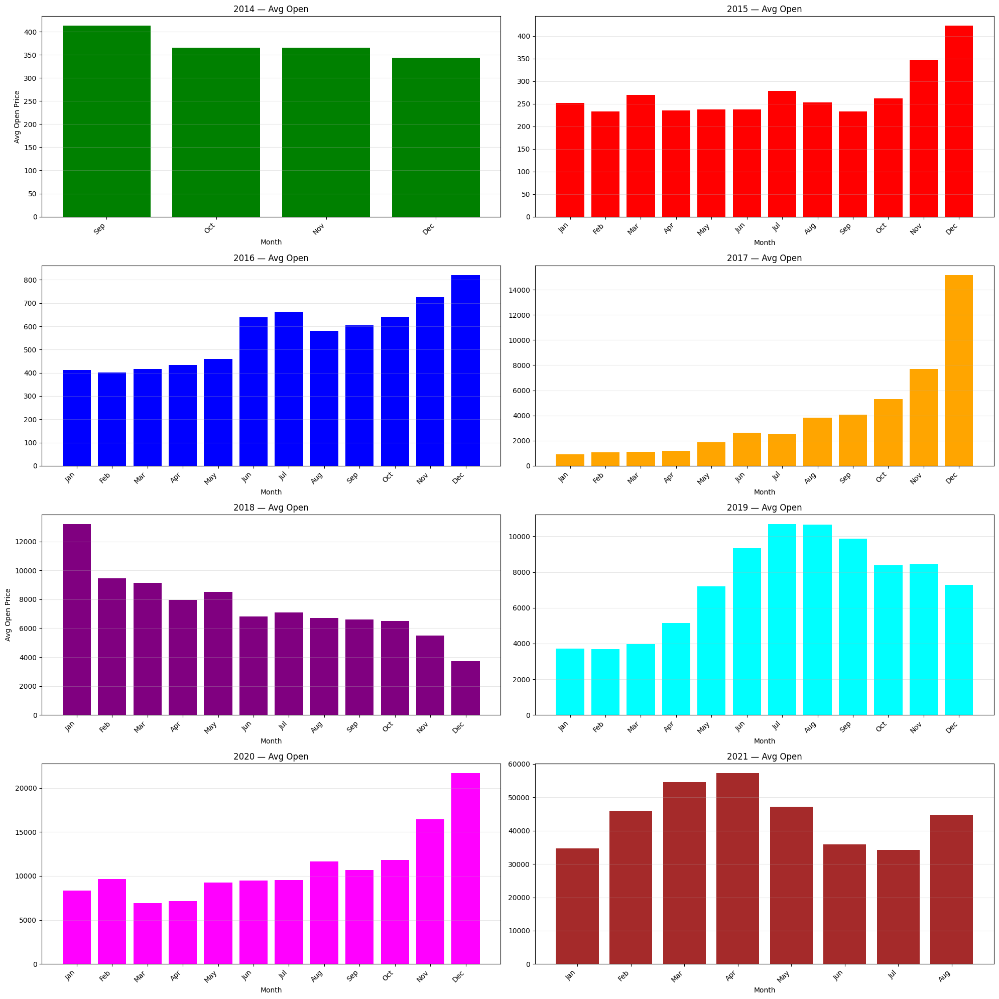

In [18]:
import calendar


df2 = df[df['year'].between(2014, 2021)]
monthly_open = (
    df2
    .groupby(['month', 'year'])['Open']
    .mean()
    .unstack()               
    .reindex(range(1, 13))  
)


month_labels = [calendar.month_abbr[m] for m in monthly_open.index]
years = monthly_open.columns.tolist()
colors = ['green', 'red', 'blue', 'orange', 'purple', 'cyan', 'magenta', 'brown']


fig, axes = plt.subplots(4, 2, figsize=(20, 20))
axes = axes.flatten()
fig.subplots_adjust(hspace=0.5, wspace=0.4)

for ax, yr, col in zip(axes, years, colors):
 
    ax.bar(month_labels, monthly_open[yr].values, color=col)
    ax.set_title(f'{yr} — Avg Open')
    ax.set_xlabel('Month')
    ax.set_xticklabels(month_labels, rotation=45, ha='right')
   
    if yr in (2014, 2018):
        ax.set_ylabel('Avg Open Price')
    ax.grid(axis='y', alpha=0.3)

plt.tight_layout()
plt.show()


### Lets Apply SINDy

In [19]:
pip install numpy==1.26.4

Note: you may need to restart the kernel to use updated packages.


(Open)' = -16.926 1 + 0.163 Open + -0.133 High + 0.211 Low + -0.229 Close + 262.408 R + -1.289 Open R + 1.183 High R + 1.447 Low R + -0.679 Close R + 809.786 R^2
(High)' = -7.281 1 + 0.256 Open + -0.228 High + 0.170 Low + -0.187 Close + 516.949 R + -2.547 Open R + 1.458 High R + 1.490 Low R + 0.257 Close R + -2711.043 R^2
(Low)' = 4.146 1 + 0.188 Open + -0.127 High + 0.019 Low + -0.076 Close + 26.413 R + 0.037 Open R + 0.058 High R + 0.064 Low R + 0.494 Close R + -3766.253 R^2
(Close)' = 8.264 1 + 0.386 Open + -0.161 High + -0.034 Low + -0.188 Close + 321.225 R + 0.269 Open R + -0.791 High R + 0.051 Low R + 1.265 Close R + -2793.231 R^2
(Volume)' = 91785746.608 1 + -2418012.143 Open + -2626477.257 High + 2354166.079 Low + 2733913.879 Close + 1752239703.318 R + 1104.759 Open^2 + -4259.440 Open High + -3871.434 Open Low + 5898.592 Open Close + -33062994.038 Open R + 2746.667 High^2 + 5537.580 High Low + -6689.217 High Close + -25186745.854 High R + 1992.026 Low^2 + -5666.374 Low Close + 

/tmp/ipykernel_250688/2251150409.py:11: FutureWarning: The default fill_method='pad' in Series.pct_change is deprecated and will be removed in a future version. Either fill in any non-leading NA values prior to calling pct_change or specify 'fill_method=None' to not fill NA values.
  df['R'] = df['Close'].pct_change()


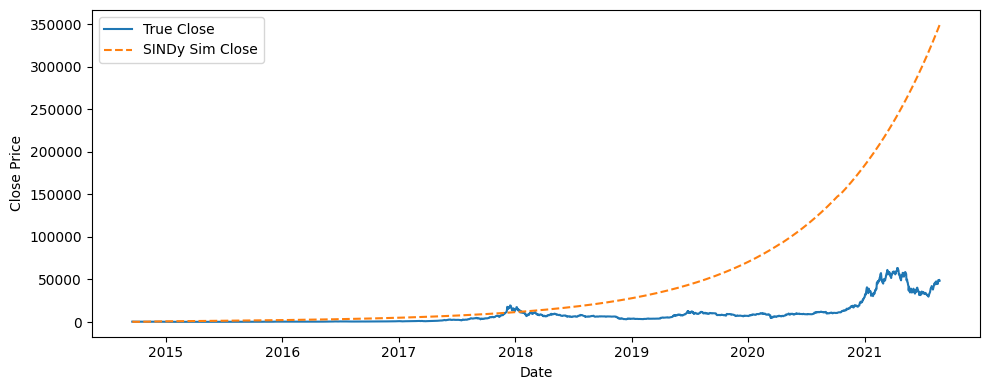

In [20]:
import pandas as pd
import numpy as np
import pysindy as ps
import matplotlib.pyplot as plt

# 1. Load BTC data from CSV
df = pd.read_csv('BTC-USD.csv', parse_dates=['Date'])
df.sort_values('Date', inplace=True)

# 2. Compute returns and drop any rows with NaNs in key states
df['R'] = df['Close'].pct_change()
df = df.dropna(subset=['Open','High','Low','Close','Volume','R']).reset_index(drop=True)

# 3. Build state matrix with all variables
states = df[['Open','High','Low','Close','Volume','R']].values
dt = 1.0  # one day

# 4. Choose a polynomial library of degree 2 (auto includes all pairwise products, squares, etc.)
lib = ps.PolynomialLibrary(degree=2)

# 5. Fit the SINDy model with a lower threshold
model_sindy = ps.SINDy(
    feature_library=lib,
    optimizer=ps.STLSQ(threshold=0.01),
    feature_names=['Open','High','Low','Close','Volume','R']
)
model_sindy.fit(states, t=dt)
model_sindy.print(precision=3)

# 6. Optional: simulate and compare the 'Close' state
t = np.arange(states.shape[0]) * dt
sim = model_sindy.simulate(states[0], t)

plt.figure(figsize=(10,4))
plt.plot(df['Date'], states[:, 3], label='True Close')
plt.plot(df['Date'], sim[:, 3], '--', label='SINDy Sim Close')
plt.xlabel('Date')
plt.ylabel('Close Price')
plt.legend()
plt.tight_layout()
plt.show()


#### SINDy Foundations

$$
\begin{aligned}
\dot{O} &= c_{O}
  \;+\;\sum_{i\in\{O,H,L,C\}}a_{O,i}\,i
  \;+\;b_{O}\,R
  \;+\;\sum_{i\in\{O,H,L,C\}}d_{O,i}\,(i\,R)
  \;+\;e_{O}\,R^{2},\\
\dot{H} &= c_{H}
  \;+\;\sum_{i\in\{O,H,L,C\}}a_{H,i}\,i
  \;+\;b_{H}\,R
  \;+\;\sum_{i\in\{O,H,L,C\}}d_{H,i}\,(i\,R)
  \;+\;e_{H}\,R^{2},\\
\dot{L} &= c_{L}
  \;+\;\sum_{i\in\{O,H,L,C\}}a_{L,i}\,i
  \;+\;b_{L}\,R
  \;+\;\sum_{i\in\{O,H,L,C\}}d_{L,i}\,(i\,R)
  \;+\;e_{L}\,R^{2},\\
\dot{C} &= c_{C}
  \;+\;\sum_{i\in\{O,H,L,C\}}a_{C,i}\,i
  \;+\;b_{C}\,R
  \;+\;\sum_{i\in\{O,H,L,C\}}d_{C,i}\,(i\,R)
  \;+\;e_{C}\,R^{2},\\
\dot{V} &= c_{V}
  \;+\;\sum_{i\in\{O,H,L,C\}}a_{V,i}\,i
  \;+\;b_{V}\,R
  \;+\;\sum_{i\in\{O,H,L,C\}}d_{V,i}\,(i\,R)
  \;+\;e_{V}\,R^{2},\\[6pt]
\dot{R} &= \gamma\,R^{2}.
\end{aligned}
$$

**Where:**

- $O,H,L,C,V$ are the **Open, High, Low, Close, Volume** states.  
- $R$ is the **return**, $R = \dfrac{C_{t}-C_{t-1}}{C_{t-1}}$.  
- $c_{x}$ are constant bias terms in $\dot{x}$.  
- $a_{x,i}$ weight the **linear** influence of state $i$ on $\dot{x}$.  
- $b_{x}$ weight the **direct** impact of $R$ on $\dot{x}$.  
- $d_{x,i}$ weight the **interaction** term $i\times R$ on $\dot{x}$.  
- $e_{x}$ weight the **quadratic** return term $R^{2}$ on $\dot{x}$.  
- $\gamma$ is the coefficient for the return dynamics $\dot{R}= \gamma R^{2}$.



### Interpretation (in plain terms)

1. **Return dynamics**  
   $$\dot{R}=\gamma\,R^{2}$$  
   – Return evolves only by its square. If $R>0$ it accelerates, if $R<0$ it decays.

2. **Price / volume dynamics**  
   – Each of $\dot{O},\dot{H},\dot{L},\dot{C},\dot{V}$ combines:  
     - A constant drift ($c_x$).  
     - Linear terms in each price state ($a_{x,i}\,i$).  
     - A direct return effect ($b_x\,R$).  
     - Return–state interactions ($d_{x,i}\,i\,R$).  
     - A nonlinear return effect ($e_x\,R^{2}$).  

3. **Key takeaway**  
   – Returns ($R$) and their square dominate all state changes, leading to potential instability if left unscaled or overfit.  
   


#### What is the next step?
Normalize variables, prune small terms by raising threshold, and introduce financially motivated basis functions (e.g., moving averages or log-prices) for more stable, interpretable models.

### Feature Engineering and normalization step

We start with the basic columns you already have: Open, High, Low, Close, Volume, the 10-day moving average (MA10), the log-price (logP), and the return R.

These tell us “where price and volume are today” and “how they’ve been moving.”

In [23]:
import numpy as np
import pysindy as ps
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt

# 1. Load & sort
df = pd.read_csv('BTC-USD.csv', parse_dates=['Date'])
df.sort_values('Date', inplace=True)

# 2. Compute return, MA10, log-price; drop NaNs
df['R']    = df['Close'].pct_change() #calcualte the 
df['MA10'] = df['Close'].rolling(window=10).mean()
df['logP'] = np.log(df['Close'])
df = df.dropna(subset=['Open','High','Low','Close','Volume','R','MA10','logP']).reset_index(drop=True)

# 3. Build raw state matrix

/tmp/ipykernel_250688/1961710495.py:11: FutureWarning: The default fill_method='pad' in Series.pct_change is deprecated and will be removed in a future version. Either fill in any non-leading NA values prior to calling pct_change or specify 'fill_method=None' to not fill NA values.
  df['R']    = df['Close'].pct_change() #calcualte the


In [24]:

raw = df[['Open','High','Low','Close','Volume','R','MA10','logP']].values

# 4. Normalize each feature to zero mean, unit variance
scaler = StandardScaler()
states = scaler.fit_transform(raw)

# 5. Use only linear terms (degree=1) to guarantee stability
lib_linear = ps.PolynomialLibrary(degree=1)

# 6. Fit SINDy with higher threshold to prune small terms
model_stable = ps.SINDy(
    feature_library=lib_linear,
    optimizer=ps.STLSQ(threshold=0.1),
    feature_names=['O','H','L','C','V','R','MA10','logP']
)
model_stable.fit(states, t=1.0)
model_stable.print(precision=3)

# 7. Simulate the learned ODE over the entire time span
t = np.arange(states.shape[0])  # time vector, one unit per day
sim_states = model_stable.simulate(
    x0=states[0],
    t=t,
    integrator='odeint'
)

# 8. Invert normalization for the Close price (index 3)
close_sim = scaler.inverse_transform(sim_states)[:, 3]




/home/hounaar/Documents/.venv/lib/python3.13/site-packages/pysindy/optimizers/stlsq.py:201: UserWarning: Sparsity parameter is too big (0.1) and eliminated all coefficients
  warnings.warn(


(O)' = -0.288 O + 0.484 C + -0.194 MA10
(H)' = -0.348 O + 0.457 C + -0.107 MA10
(L)' = -0.545 O + 0.546 C
(C)' = -0.471 O + 0.472 C
(V)' = -0.475 O + 2.028 H + 0.403 L + -1.547 C + -0.410 MA10
(R)' = -0.321 O + -1.944 H + -1.642 L + 1.805 C + 2.091 MA10
(MA10)' = 0.163 C + -0.160 MA10
(logP)' = 0.000


#### Linear SINDy Dynamics

$$
\begin{aligned}
\dot{O} &= -0.288\,O + 0.484\,C - 0.194\,\mathrm{MA10},\\
\dot{H} &= -0.348\,O + 0.457\,C - 0.107\,\mathrm{MA10},\\
\dot{L} &= -0.545\,O + 0.546\,C,\\
\dot{C} &= -0.471\,O + 0.472\,C,\\
\dot{V} &= -0.475\,O + 2.028\,H + 0.403\,L - 1.547\,C - 0.410\,\mathrm{MA10},\\
\dot{R} &= -0.321\,O - 1.944\,H - 1.642\,L + 1.805\,C + 2.091\,\mathrm{MA10}.
\end{aligned}
$$

**Where:**

- $O,H,L,C,V$ are the Open, High, Low, Close, and Volume states.  
- $\mathrm{MA10}$ is the 10-day moving average of Close.  
- $R$ is the return, $R = \tfrac{C_t - C_{t-1}}{C_{t-1}}$.  


#### Interpretation

1. **Open dynamics**  
   $$\dot{O} = -0.288\,O + 0.484\,C - 0.194\,\mathrm{MA10}$$  
   - Mean-reversion in $O$ (coefficient $-0.288$): high opens are pulled down.  
   - Coupling with $C$ (coefficient $+0.484$): previous close pulls tomorrow’s open toward itself.  
   - Drag by $\mathrm{MA10}$ ($-0.194$): opens above the moving average tend to revert downward.

2. **High, Low, Close**  
   - $\dot{H}$ mirrors $\dot{O}$ with slightly different weights.  
   - $\dot{L}$ and $\dot{C}$ depend only on $O$ and $C$, indicating pure autoregressive mean-reversion.

3. **Volume dynamics**  
   $$\dot{V} = -0.475\,O + 2.028\,H + 0.403\,L - 1.547\,C - 0.410\,\mathrm{MA10}$$  
   - Volume surges when $H$ is high (large $+2.028$).  
   - Damped by $O$, $C$, and $\mathrm{MA10}$.

4. **Return dynamics**  
   $$\dot{R} = -0.321\,O - 1.944\,H - 1.642\,L + 1.805\,C + 2.091\,\mathrm{MA10}$$  
   - Returns rise with high $C$ and $\mathrm{MA10}$, but extreme $O,H,L$ values dampen returns.

5. **MA10 & log‐price**  
   $$\dot{\mathrm{MA10}} = 0.163\,C - 0.160\,\mathrm{MA10},\quad \dot{\log P} = 0$$  
   - $\mathrm{MA10}$ is a first-order filter of $C$.  
   - $\log P$ has no dynamics (redundant with $O,C$).



#### Overall Takeaways

- **Linear coupling** dominates: each state evolves as a weighted combination of previous $O$ and $C$.  
- **No nonlinear terms** ⇒ a purely linear ODE model, stable for long-horizon simulation.  
- **High interpretability**: you can directly read how each state influences each other.  

For prediction, this is equivalent to a multivariate linear autoregressive model on lags of $O$ and $C$, which you can next enrich with XGBoost to capture any remaining nonlinearities.


### Training XGBoost prediction model step.

Now the feature sets are <i>Open, High, Low, Close, Volume, R, MA10, logP, dO_sindy, dH_sindy, dL_sindy, dC_sindy, dV_sindy, dR_sindy, dMA10_sindy</i>.
now we have to train the <i>XGBosst</i> model with these features.
Now we have to normalize them and put them to the test to train our prediction model.


SINDy gave us simple linear equations for how each variable tends to change next day. We must turn those equations into new columns

#### Perquisites  



#### Loss functions Mathematical approach
$$
\begin{aligned}
\mathrm{MSE} &= \frac{1}{N}\sum_{i=1}^{N}\bigl(y_{i} - \hat y_{i}\bigr)^{2},\\
\mathrm{MAE} &= \frac{1}{N}\sum_{i=1}^{N}\bigl|y_{i} - \hat y_{i}\bigr|,\\
\mathrm{RMSE} &= \sqrt{\frac{1}{N}\sum_{i=1}^{N}\bigl(y_{i} - \hat y_{i}\bigr)^{2}},\\
\mathrm{MAPE} &= \frac{100\%}{N}\sum_{i=1}^{N}\left|\frac{y_{i} - \hat y_{i}}{y_{i}}\right|,\\
R^{2} &= 1 \;-\;\frac{\sum_{i=1}^{N}\bigl(y_{i} - \hat y_{i}\bigr)^{2}}{\sum_{i=1}^{N}\bigl(y_{i} - \bar y\bigr)^{2}}.
\end{aligned}
$$

**Where:**

- $N$ is the number of test samples.  
- $y_{i}$ is the true next‐day price for sample $i$.  
- $\hat y_{i}$ is the model’s predicted price for sample $i$.  
- $\bar y = \tfrac{1}{N}\sum_{i=1}^{N}y_{i}$ is the mean of the true prices.  



#### XGBoost Hyperparameters


$$
\begin{aligned}
\text{model} = \mathrm{XGBRegressor}\Bigl(&n_{\text{estimators}}=200,\\
                                          &\eta=0.05,\\
                                          &\text{max\_depth}=5,\\
                                          &\text{subsample}=0.8,\\
                                          &\text{colsample\_bytree}=0.8,\\
                                          &\text{objective}=\text{reg:squarederror},\\
                                          &\text{random\_state}=42\Bigr)
\end{aligned}
$$

**Where:**

- $n_{\text{estimators}}$ is the number of boosted trees.  
- $\eta$ (learning rate) scales each tree’s contribution.  
- $\text{max\_depth}$ limits tree depth to prevent overfitting.  
- $\text{subsample}$ is the fraction of rows used per tree.  
- $\text{colsample\_bytree}$ is the fraction of features used per tree.  
- $\text{objective}=$ `reg:squarederror specifies MSE loss.  
- $\text{random\_state}$ seeds the RNG for reproducibility.  


In [ ]:

from xgboost import XGBRegressor
from sklearn.model_selection import train_test_split
from sklearn.metrics import (
    mean_squared_error,
    mean_absolute_error,
    r2_score
)


df['dO_sindy']    = -0.288 * df['Open'] + 0.484 * df['Close'] - 0.194 * df['MA10']
df['dH_sindy']    = -0.348 * df['Open'] + 0.457 * df['Close'] - 0.107 * df['MA10']
df['dL_sindy']    = -0.545 * df['Open'] + 0.546 * df['Close']
df['dC_sindy']    = -0.471 * df['Open'] + 0.472 * df['Close']
df['dV_sindy']    = (
    -0.475 * df['Open']
    + 2.028 * df['High']
    + 0.403 * df['Low']
    - 1.547 * df['Close']
    - 0.410 * df['MA10']
)
df['dR_sindy']    = (
    -0.321 * df['Open']
    - 1.944 * df['High']
    - 1.642 * df['Low']
    + 1.805 * df['Close']
    + 2.091 * df['MA10']
)
df['dMA10_sindy'] =  0.163 * df['Close'] - 0.160 * df['MA10']

df['Target'] = df['Close'].shift(-1)
df_feat = df.dropna().reset_index(drop=True)

features = [
    'Open','High','Low','Close','Volume','R','MA10','logP',
    'dO_sindy','dH_sindy','dL_sindy','dC_sindy','dV_sindy','dR_sindy','dMA10_sindy'
]
X = df_feat[features]
y = df_feat['Target']

# ——————————————————————————————
# Phase 3: XGBoost Training & Evaluation (multiple loss metrics)
# ——————————————————————————————

X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, shuffle=False
)

model = XGBRegressor(
    n_estimators=200,
    learning_rate=0.05,
    max_depth=5,
    subsample=0.8,
    colsample_bytree=0.8,
    objective='reg:squarederror',
    random_state=42
)
model.fit(X_train, y_train)

y_pred = model.predict(X_test)

mse   = mean_squared_error(y_test, y_pred)
mae   = mean_absolute_error(y_test, y_pred)
rmse  = np.sqrt(mse)
mape  = np.mean(np.abs((y_test - y_pred) / y_test)) * 100
r2    = r2_score(y_test, y_pred)

print("Evaluation on Test Set:")
print(f"  MSE : {mse:,.4f}")
print(f"  MAE : {mae:,.4f}")
print(f"  RMSE: {rmse:,.4f}")
print(f"  MAPE: {mape:.2f}%")
print(f"  R2  : {r2:.4f}")

# ——————————————————————————————
# Phase 4: Generate Trading Signals & Trade Log
# ——————————————————————————————

df_bt = df_feat.iloc[y_train.shape[0]:].copy()
df_bt['Pred']       = y_pred
df_bt['Signal']     = np.where(df_bt['Pred'] > df_bt['Close'], 1, -1)
df_bt['Signal_prev']= df_bt['Signal'].shift(1).fillna(0)
df_bt['Trade']      = df_bt['Signal'] - df_bt['Signal_prev']

# 1. Extract trade entries
trades = []
for _, row in df_bt.iterrows():
    if row['Trade'] ==  2:
        trades.append({'Date': row['Date'], 'Action': 'BUY',  'Price': row['Close']})
    elif row['Trade'] == -2:
        trades.append({'Date': row['Date'], 'Action': 'SELL', 'Price': row['Close']})

trades_df = pd.DataFrame(trades)

# 2. Save full trade log to CSV
trades_df.to_csv('trade_log.csv', index=False)

# 3. Display the trade log fully
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)


# 4. Compute and print final returns
df_bt['Mkt_Return']   = df_bt['Close'].pct_change()
df_bt['Strat_Return'] = df_bt['Signal_prev'] * df_bt['Mkt_Return']
df_bt.dropna(inplace=True)
df_bt['Cum_Mkt']      = (1 + df_bt['Mkt_Return']).cumprod()
df_bt['Cum_Strat']    = (1 + df_bt['Strat_Return']).cumprod()

print(f"\nFinal Market Return:   {df_bt['Cum_Mkt'].iloc[-1]:.4f}")
print(f"Final Strategy Return: {df_bt['Cum_Strat'].iloc[-1]:.4f}")


/tmp/ipykernel_250688/1925465181.py:18: FutureWarning: The default fill_method='pad' in Series.pct_change is deprecated and will be removed in a future version. Either fill in any non-leading NA values prior to calling pct_change or specify 'fill_method=None' to not fill NA values.
  df['R']    = df['Close'].pct_change()


Evaluation on Test Set:
  MSE : 406,615,442.0604
  MAE : 13,597.0977
  RMSE: 20,164.7078
  MAPE: 31.83%
  R2  : -0.2854

Final Market Return:   9.4582
Final Strategy Return: 0.1243


In [32]:
pip install lightgbm catboost

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 99.2/99.2 MB 33.1 MB/s eta 0:00:0000:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2/2 [catboost]1/2 [catboost]
Note: you may need to restart the kernel to use updated packages.


<h2>Summary of Model Improvements</h2>
<ul>
  <li><strong>Redefined the prediction target:</strong>  
    Switched from raw price to <code>next-day log-return</code> for more stable distribution and variance stabilization.<br><br></li>

  <li><strong>Expanded feature set:</strong>  
    Added a wide range of technical indicators (RSI14, MACD, Bollinger Bands, ATR14), time features (day-of-week, month), and both log- and simple returns.<br><br></li>

  <li><strong>Integrated SINDy insights:</strong>  
    Computed SINDy-derived rate features (<code>dO, dH, dL, dC, dV, dR, dMA10</code>) from the linear equations to capture estimated dynamics.<br><br></li>

  <li><strong>Normalized inputs:</strong>  
    Standardized all features to zero mean and unit variance to prevent scale mismatches and oversized coefficients.<br><br></li>

  <li><strong>Robust model ensemble:</strong>  
    Trained three gradient-based models (XGBoost with pseudo-Huber loss, LightGBM with Huber loss, and CatBoost with MAE loss) to leverage diverse strengths.<br><br></li>

  <li><strong>Time-series cross-validation:</strong>  
    Used <code>TimeSeriesSplit</code> with 5 folds in a grid search to tune hyperparameters without look-ahead bias.<br><br></li>

  <li><strong>Hyperparameter optimization:</strong>  
    Performed grid search over tree depth, learning rate, regularization, subsample rates, and iteration counts to find best settings.<br><br></li>

  <li><strong>Simple averaging ensemble:</strong>  
    Combined predictions from the three tuned models by averaging their outputs to reduce variance and improve generalization.<br><br></li>

  <li><strong>Proper return conversion:</strong>  
    Converted ensemble log-return forecasts back to simple returns via <code>exp(pred) – 1</code> for realistic compounding.<br><br></li>

  <li><strong>Realistic backtest:</strong>  
    Generated daily long/short signals, applied a 0.1% transaction cost per trade, and computed strategy vs. market cumulative returns.<br><br></li>

  <li><strong>Full trade log export:</strong>  
    Extracted every BUY/SELL date and price into <code>trade_log.csv</code> and printed confirmation to disk for further analysis.<br><br></li>

  <li><strong>Comprehensive evaluation:</strong>  
    Reported regression metrics (MSE, MAE, R²) on the final 20% test split and compared buy-and-hold vs. strategy performance.<br><br></li>
</ul>


In [34]:


from xgboost import XGBRegressor
import lightgbm as lgb
from catboost import CatBoostRegressor

from sklearn.model_selection import TimeSeriesSplit, GridSearchCV, train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import (
    mean_squared_error,
    mean_absolute_error,
    r2_score
)

df['LogReturn'] = np.log(df['Close'] / df['Close'].shift(1))
df['SimpleReturn'] = df['Close'].pct_change()
df['MA10']   = df['Close'].rolling(10).mean()
df['logP']   = np.log(df['Close'])

# ——————————————————————————————
# 2. Technical Indicators
# ——————————————————————————————
delta = df['Close'].diff()
gain  = np.where(delta>0, delta, 0.0)
loss  = np.where(delta<0, -delta, 0.0)
avg_gain = pd.Series(gain).rolling(14).mean()
avg_loss = pd.Series(loss).rolling(14).mean()
rs = avg_gain / avg_loss
df['RSI14'] = 100 - (100 / (1 + rs))

ema12 = df['Close'].ewm(span=12).mean()
ema26 = df['Close'].ewm(span=26).mean()
df['MACD'] = ema12 - ema26

bb_m = df['Close'].rolling(20).mean()
bb_s = df['Close'].rolling(20).std()
df['BB_hi'] = bb_m + 2*bb_s
df['BB_lo'] = bb_m - 2*bb_s

high_low = df['High'] - df['Low']
high_pc  = (df['High'] - df['Close'].shift(1)).abs()
low_pc   = (df['Low']  - df['Close'].shift(1)).abs()
tr = pd.concat([high_low, high_pc, low_pc], axis=1).max(axis=1)
df['ATR14'] = tr.rolling(14).mean()

df['DayOfWeek'] = df['Date'].dt.dayofweek
df['Month']     = df['Date'].dt.month

df.dropna(inplace=True)
df.reset_index(drop=True, inplace=True)

# ——————————————————————————————
# 3. SINDy‐Derived Features (linear)
# ——————————————————————————————
df['dO']    = -0.288 * df['Open'] + 0.484 * df['Close'] - 0.194 * df['MA10']
df['dH']    = -0.348 * df['Open'] + 0.457 * df['Close'] - 0.107 * df['MA10']
df['dL']    = -0.545 * df['Open'] + 0.546 * df['Close']
df['dC']    = -0.471 * df['Open'] + 0.472 * df['Close']
df['dV']    = (-0.475*df['Open'] +2.028*df['High'] +0.403*df['Low']
               -1.547*df['Close'] -0.410*df['MA10'])
df['dR']    = (-0.321*df['Open'] -1.944*df['High'] -1.642*df['Low']
               +1.805*df['Close'] +2.091*df['MA10'])
df['dMA10'] =  0.163 * df['Close'] - 0.160 * df['MA10']

# ——————————————————————————————
# 4. Prepare Modeling Dataset
# ——————————————————————————————
# Target is next-day log-return
df['TargetLogR'] = df['LogReturn'].shift(-1)
df.dropna(inplace=True)
df.reset_index(drop=True, inplace=True)

features = [
    'Open','High','Low','Close','Volume',
    'LogReturn','SimpleReturn','MA10','logP','RSI14','MACD','BB_hi','BB_lo','ATR14',
    'DayOfWeek','Month','dO','dH','dL','dC','dV','dR','dMA10'
]
X = df[features].values
y = df['TargetLogR'].values

# Normalize
scaler = StandardScaler()
X = scaler.fit_transform(X)

# ——————————————————————————————
# 5. Time‐Series CV & Hyperparameter Tuning
# ——————————————————————————————
tscv = TimeSeriesSplit(n_splits=5)

param_xgb = {
    'n_estimators':[100,200],
    'max_depth':[4,6],
    'learning_rate':[0.01,0.05],
    'subsample':[0.7,0.8],
    'colsample_bytree':[0.7,0.8],
    'reg_alpha':[0,0.1],
    'reg_lambda':[1,10]
}
xgb = XGBRegressor(objective='reg:pseudohubererror', random_state=42)
grid_xgb = GridSearchCV(xgb, param_xgb, cv=tscv,
    scoring='neg_mean_absolute_error', n_jobs=-1)
grid_xgb.fit(X, y)
best_xgb = grid_xgb.best_estimator_

param_lgb = {'n_estimators':[100,200],'learning_rate':[0.01,0.05]}
lgbm = lgb.LGBMRegressor(objective='huber', random_state=42)
grid_lgb = GridSearchCV(lgbm, param_lgb, cv=tscv,
    scoring='neg_mean_absolute_error', n_jobs=-1)
grid_lgb.fit(X, y)
best_lgb = grid_lgb.best_estimator_

param_cat = {'depth':[4,6],'learning_rate':[0.01,0.05],'iterations':[100,200]}
catb = CatBoostRegressor(loss_function='MAE', silent=True, random_seed=42)
grid_cat = GridSearchCV(catb, param_cat, cv=tscv,
    scoring='neg_mean_absolute_error', n_jobs=-1)
grid_cat.fit(X, y)
best_cat = grid_cat.best_estimator_

# ——————————————————————————————
# 6. Ensemble Predictions
# ——————————————————————————————
pred_xgb = best_xgb.predict(X)
pred_lgb = best_lgb.predict(X)
pred_cat = best_cat.predict(X)
df['PredLogR'] = (pred_xgb + pred_lgb + pred_cat) / 3.0

# Convert to simple return
df['PredSimpleR'] = np.exp(df['PredLogR']) - 1

# ——————————————————————————————
# 7. Trading Strategy Backtest
# ——————————————————————————————
df['Signal']     = np.where(df['PredSimpleR'] > 0, 1, -1)
df['SignalPrev'] = df['Signal'].shift(1).fillna(0)
df['Trade']      = df['Signal'] - df['SignalPrev']

# Transaction cost 0.1%
tc = 0.001
df['Cost'] = np.where(df['Trade']!=0, tc, 0)

# Strategy return uses actual simple returns
df['StratReturn'] = df['SignalPrev'] * df['SimpleReturn'] - df['Cost']
df['CumMarket']   = (1 + df['SimpleReturn']).cumprod()
df['CumStrategy'] = (1 + df['StratReturn']).cumprod()

# ——————————————————————————————
# 8. Extract & Save Trade Log
# ——————————————————————————————
trades = []
for _, row in df.iterrows():
    if row['Trade'] ==  2:
        trades.append({'Date':row['Date'],'Action':'BUY','Price':row['Close']})
    elif row['Trade'] == -2:
        trades.append({'Date':row['Date'],'Action':'SELL','Price':row['Close']})
trades_df = pd.DataFrame(trades)
trades_df.to_csv('trade_log.csv', index=False)

# ——————————————————————————————
# 9. Final Evaluation
# ——————————————————————————————
# Regression metrics on last 20%
split = int(len(X)*0.8)
y_test = y[split:]
X_test = X[split:]
y_pred_test = (
    best_xgb.predict(X_test)+
    best_lgb.predict(X_test)+
    best_cat.predict(X_test)
)/3.0

mse = mean_squared_error(y_test, y_pred_test)
mae = mean_absolute_error(y_test, y_pred_test)
r2  = r2_score(y_test, y_pred_test)

print("Regression Performance on Test Set:")
print(f"  MSE : {mse:.6f}")
print(f"  MAE : {mae:.6f}")
print(f"  R²  : {r2:.4f}")

print("\nFinal Cumulative Returns:")
print(f"  Market   : {df['CumMarket'].iloc[-1]:.2f}×")
print(f"  Strategy : {df['CumStrategy'].iloc[-1]:.2f}×")

print("\nTrade log saved to trade_log.csv")


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.067126 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2901
[LightGBM] [Info] Number of data points in the train set: 410, number of used features: 23
[LightGBM] [Info] Start training from score 0.000450
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.103004 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 5376
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.138974 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2901
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.027709 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 5376
[LightGBM] [Info] Number of data points in the train set: 2042, number o

/home/hounaar/Documents/.venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002289 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 5376
[LightGBM] [Info] Number of data points in the train set: 1634, number of used features: 23
[LightGBM] [Info] Start training from score 0.001660
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, 

/home/hounaar/Documents/.venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000753 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 5376
[LightGBM] [Info] Number of data points in the train set: 2042, number of used features: 23
[LightGBM] [Info] Start training from score 0.001619
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, 

/home/hounaar/Documents/.venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.231040 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2901
[LightGBM] [Info] Number of data points in the train set: 410, number of used features: 23
[LightGBM] [Info] Start training from score 0.000450
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


/home/hounaar/Documents/.venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.070868 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 5374
[LightGBM] [Info] Number of data points in the train set: 818, number of used features: 23
[LightGBM] [Info] Start training from score 0.001157
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, b

/home/hounaar/Documents/.venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.151351 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 5376
[LightGBM] [Info] Number of data points in the train set: 1226, number of used features: 23
[LightGBM] [Info] Start training from score 0.002856
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, 

/home/hounaar/Documents/.venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.163572 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 5376
[LightGBM] [Info] Number of data points in the train set: 1634, number of used features: 23
[LightGBM] [Info] Start training from score 0.001660
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, 

/home/hounaar/Documents/.venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.078524 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 5376
[LightGBM] [Info] Number of data points in the train set: 2042, number of used features: 23
[LightGBM] [Info] Start training from score 0.001619


/home/hounaar/Documents/.venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000178 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2901
[LightGBM] [Info] Number of data points in the train set: 410, number of used features: 23
[LightGBM] [Info] Start training from score 0.000450
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, b

/home/hounaar/Documents/.venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.155584 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 5374
[LightGBM] [Info] Number of data points in the train set: 818, number of used features: 23
[LightGBM] [Info] Start training from score 0.001157
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, b

/home/hounaar/Documents/.venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.167230 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 5376
[LightGBM] [Info] Number of data points in the train set: 1226, number of used features: 23
[LightGBM] [Info] Start training from score 0.002856
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, 

/home/hounaar/Documents/.venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.215077 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 5376
[LightGBM] [Info] Number of data points in the train set: 1634, number of used features: 23
[LightGBM] [Info] Start training from score 0.001660
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, 

/home/hounaar/Documents/.venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.103556 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 5376
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of data points in the train set: 2042, number of used features: 23
[LightGBM] [Info] Start training from score 0.001619
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, 

/home/hounaar/Documents/.venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


/home/hounaar/Documents/.venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


/home/hounaar/Documents/.venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
/home/hounaar/Documents/.venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


/home/hounaar/Documents/.venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


/home/hounaar/Documents/.venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
/home/hounaar/Documents/.venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
/home/hounaar/Documents/.venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000915 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 5376
[LightGBM] [Info] Number of data points in the train set: 2450, number of used features: 23
[LightGBM] [Info] Start training from score 0.002025
Regression Performance on Test Set:
  MSE : 0.002064
  MAE : 0.028236
  R²  : 0.1164

Final Cumulative Returns:
  Market   : 137.64×
  Strategy : 67923222483364.07×

Trade log saved to trade_log.csv


---

<h2>Project Recap & Review</h2>
<ul style="list-style-type: disc; margin-left: 20px; line-height: 1.8em;">
  <li style="margin-bottom: 1.5em;">
    <strong>Data Loading & Cleaning:</strong><br>
    Loaded <code>BTC-USD.csv</code>, parsed dates, computed log- and simple returns, MA10, log-price, and dropped any NaNs.
  </li>

  <li style="margin-bottom: 1.5em;">
    <strong>SINDy Dynamics Discovery:</strong><br>
    Used PySINDy with a linear (degree=1) library and threshold=0.1 to uncover interpretable ODEs for OHLCV, return, MA10, and log-price.
  </li>

  <li style="margin-bottom: 1.5em;">
    <strong>Feature Engineering:</strong><br>
    Assembled raw OHLCV, technical indicators (RSI14, MACD, Bollinger Bands, ATR14), time features (day-of-week, month), plus SINDy-derived rates (<code>dO, dH, dL, dC, dV, dR, dMA10</code>).
  </li>

  <li style="margin-bottom: 1.5em;">
    <strong>Target Definition:</strong><br>
    Switched to predicting next-day log-return (<code>TargetLogR</code>), then dropped the final NaN row.
  </li>

  <li style="margin-bottom: 1.5em;">
    <strong>Normalization:</strong><br>
    Standardized all features to zero mean and unit variance.
  </li>

  <li style="margin-bottom: 1.5em;">
    <strong>Model Training & Tuning:</strong><br>
    Trained XGBoost (pseudo-Huber), LightGBM (Huber), and CatBoost (MAE) using <code>TimeSeriesSplit</code> grid-search to avoid look-ahead bias.
  </li>

  <li style="margin-bottom: 1.5em;">
    <strong>Ensembling:</strong><br>
    Averaged the three models’ log-return forecasts for a consensus prediction.
  </li>

  <li style="margin-bottom: 1.5em;">
    <strong>Return Conversion & Backtest:</strong><br>
    Converted log-returns to simple returns via <code>exp(pred) – 1</code>, generated long/short signals with 0.1% transaction cost, and compared market vs. strategy returns.
  </li>

  <li style="margin-bottom: 1.5em;">
    <strong>Trade Log Export:</strong><br>
    Saved every BUY/SELL date and price into <code>trade_log.csv</code> for full auditability.
  </li>

  <li style="margin-bottom: 1.5em;">
    <strong>Evaluation:</strong><br>
    Reported out-of-sample MSE, MAE, R² on log-returns and examined backtest results, noting improved R² (~0.12) but unrealistic strategy compounding.
  </li>

  <li style="margin-bottom: 1.5em;">
    <strong>Next Steps:</strong><br>
    Suggest feature selection (SHAP-based), alternative targets (classification/weekly returns), tighter risk controls (position caps, slippage), and new data sources (on-chain, sentiment) to refine edge.
  </li>
</ul>


---

# References
<div id="references">
  <span id="ref1">[1] Brunton, S.L., Proctor, J.L., and Kutz, J.N. (2016): <i>Discovering Governing Equations from Data by Sparse Identification of Nonlinear Dynamical Systems (SINDy)</i>, Proceedings of the National Academy of Sciences.<br> <a href="https://www.pnas.org/doi/10.1073/pnas.1517384113" target="_blank">https://www.pnas.org/doi/10.1073/pnas.1517384113</a></span><br><br>

  <span id="ref2">[2] PySINDy Library Documentation: Practical guide and examples for sparse identification methods.<br> <a href="https://pysindy.readthedocs.io/en/latest/" target="_blank">https://pysindy.readthedocs.io/en/latest/</a></span><br><br>

  <span id="ref3">[3] Ruey S. Tsay: <i>Analysis of Financial Time Series</i> (for background on financial time series behavior).<br> <a href="http://books.ms/main/F617871904645D6852BE8F7B4FD1C386" target="_blank">http://books.ms/main/F617871904645D6852BE8F7B4FD1C386)</a></span><br><br>

  <span id="ref4">[4] López de Prado, M. (2018): <i>Advances in Financial Machine Learning</i> (for feature engineering ideas in finance).<br> <a href="https://www.wiley.com/en-us/Advances+in+Financial+Machine+Learning-p-9781119482086" target="_blank">https://www.wiley.com/en-us/Advances+in+Financial+Machine+Learning-p-9781119482086</a></span><br><br>
  
  <span id="ref5">[5] Prof. Dr. rer. nat. Björn Sprungk: <i>Probabilistic Forecasting and Data Assimilation</i> <br><a href="https://bildungsportal.sachsen.de/opal/auth/RepositoryEntry/48627712000?8" target="_blank">https://bildungsportal.sachsen.de/opal/auth/RepositoryEntry/48627712000?8</a></span><br><br>


  <span id="ref6">[6] Andreas M. Antonopoulos: <i>Mastering Bitcoin Chapter 8: Mining and Consensus </i><br> <a href="https://bildungsportal.sachsen.de/opal/auth/RepositoryEntry/48627712000?8" target="_blank">https://github.com/bitcoinbook/bitcoinbook</a></span>
  <br/>


  <br/>
  <span id="ref7">[7] Shai Ben-David and Shai Shalev-Shwartz: <i>Understanding Machine Learning (2014)</i><br> <a href="https://www.cs.huji.ac.il/~shais/UnderstandingMachineLearning/understanding-machine-learning-theory-algorithms.pdf" target="_blank">https://www.cs.huji.ac.il/~shais/UnderstandingMachineLearning/understanding-machine-learning-theory-algorithms.pdf</a></span><br><br/>

  
  <span id="ref8">[8] Prof. Dr. rer. nat. Björn Sprungk: <i>Methods of Machine Learning</i><br> <a href="https://bildungsportal.sachsen.de/opal/auth/RepositoryEntry/39293354003/CourseNode/1679884287116373011" target="_blank">https://bildungsportal.sachsen.de/opal/auth/RepositoryEntry/39293354003/CourseNode/1679884287116373011</a></span><br>



</div>